<a href="https://colab.research.google.com/github/esther033/2026-1_CV/blob/main/hw2/hw2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2 # OpenCV를 사용하기 위해 cv2 import
import numpy as np # 넘파이 사용
import matplotlib.pyplot as plt   # matplotlib : 시각화라이브러리
from google.colab.patches import cv2_imshow    # colab에서 cv.imshow 사용

In [ ]:
print("OpenCV version:") # OpenCV 버전 확인
print(cv2.__version__)

OpenCV version:
4.13.0


In [ ]:
# 깃헙 kjcheoi-class의 CV 리파지토리의 파일 Fig0309(a)(washed_out_aerial_image).tif 다운로드
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0309(a)(washed_out_aerial_image).tif"

--2026-04-11 05:28:36--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0309(a)(washed_out_aerial_image).tif
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 589115 (575K) [image/tiff]
Saving to: ‘Fig0309(a)(washed_out_aerial_image).tif.7’

Fig0309(a)(washed_o 100%[===================>] 575.31K  --.-KB/s    in 0.04s   

2026-04-11 05:28:36 (13.0 MB/s) - ‘Fig0309(a)(washed_out_aerial_image).tif.7’ saved [589115/589115]



In [ ]:
img = cv2.imread('Fig0309(a)(washed_out_aerial_image).tif') # 이미지 불러오기
if img is not None:
    print("이미지를 읽어왔습니다.")
else:
    print("이미지를 읽어오지 못했습니다.")
print(f"변수 타입: {type(img)}")

이미지를 읽어왔습니다.
변수 타입: <class 'numpy.ndarray'>


In [ ]:
# 이미지 정보 출력 : 가로, 세로, 채널
print(img.shape)
print("\nwidth: {} pixels".format(img.shape[1]))
print("height: {} pixels".format(img.shape[0]))
print("channels: {}".format(img.shape[2]))

(769, 765, 3)

width: 765 pixels
height: 769 pixels
channels: 3


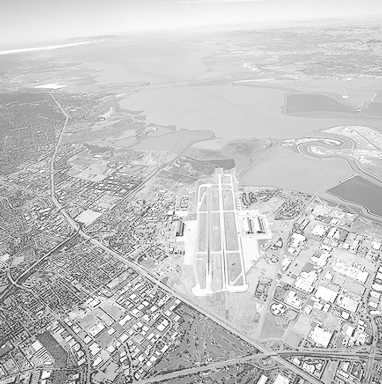

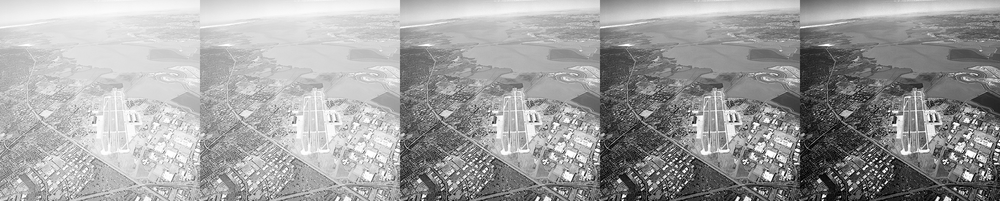

In [ ]:
img=cv2.imread('Fig0309(a)(washed_out_aerial_image).tif')

img=cv2.resize(img,dsize=(0,0),fx=0.5,fy=0.5)
cv2_imshow(img)

def gamma(f,gamma=1.0):
    f1=f/255.0			# L=256이라고 가정, 픽셀을 0~1로 정규
    return np.uint8(255*(f1**gamma))   # 감마 보정 후 다시 0~255로 변환

gc=np.hstack((gamma(img,0.75),gamma(img,1.0),gamma(img,2.0),gamma(img,3.0),gamma(img,4.0)))
## np.hstack : NumPy 배열을 '수평(Horizontal)'으로 쌓아주는 함수
cv2_imshow(gc)

# HW#2-1
**결과 분석**
1. gamma < 1
*   어두운 영역이 밝아진다.

2. gamma = 1
*   원본 이미지 그대로 (변환 없음)

3. gamma > 1
*   밝은 영역이 어두워진다.

**결론**

입력 영상이 washed-out 상태이므로 γ > 1에서 더 자연스러운 대비를 얻을 수 있었다.

In [ ]:
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0310(b)(washed_out_pollen_image).tif"

--2026-04-11 05:45:31--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0310(b)(washed_out_pollen_image).tif
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 791311 (773K) [image/tiff]
Saving to: ‘Fig0310(b)(washed_out_pollen_image).tif’

Fig0310(b)(washed_o 100%[===================>] 772.76K  --.-KB/s    in 0.05s   

2026-04-11 05:45:31 (16.1 MB/s) - ‘Fig0310(b)(washed_out_pollen_image).tif’ saved [791311/791311]



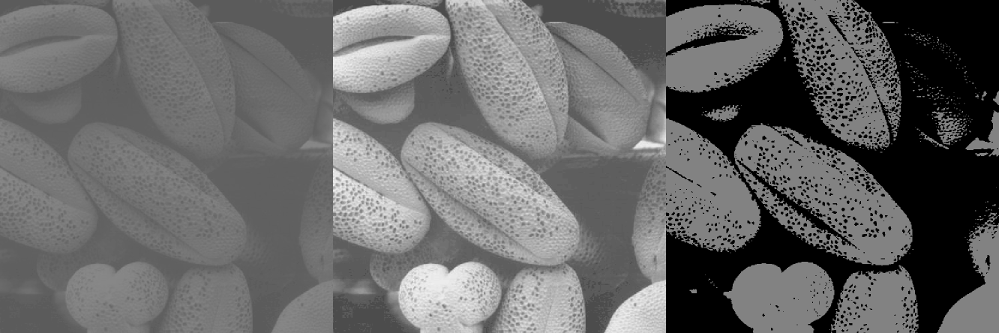

In [ ]:
img2=cv2.imread('Fig0310(b)(washed_out_pollen_image).tif')
# contrast stretching
r1, r2 = 70, 140
s1, s2 = 0, 255
def contrast_stretch(img2):  # 결과 저장용 배열 (float로 계산 후 uint8로 변환)
    result = np.zeros_like(img2, dtype=np.float32)

    # 구간 나누기
    mask1 = img2 < r1 # 어두운 영역
    mask2 = (img2 >= r1) & (img2 <= r2) # 강조할 중간 영역
    mask3 = img2 > r2 # 밝은 영역

    # 각 구간별 변환
    result[mask1] = 0 # 어두운 영역 → 0으로 압축
    result[mask2] = ((img2[mask2]-r1)/(r2-r1))*(s2-s1)+s1 ## 중간 영역 → 선형적으로 확장 (contrast 증가)
    result[mask3] = 255  # 밝은 영역 → 255로 압축

    return np.uint8(result) # 0~255로 변환하여 반환

out = contrast_stretch(img2) # Contrast Stretching 적용

# thresholding
_, th = cv2.threshold(img2, 110, 130, cv2.THRESH_BINARY)

def resize_half(img2):
    return cv2.resize(img2, (0,0), fx=0.5, fy=0.5)

result = np.hstack((resize_half(img2), resize_half(out), resize_half(th)))
cv2_imshow(result)


# HW#2-2
**결과 분석**

1. r < r1
* 어두운 영역이 0으로 압축된다.
* 매우 어두운 픽셀들은 모두 검정으로 변환된다.
2. r1 ≤ r ≤ r2
* 해당 구간의 밝기 값이 선형적으로 확장된다.
* 대비가 증가하여 객체의 질감과 경계가 뚜렷해진다.
3. r > r2
* 밝은 영역이 255로 압축된다.
* 매우 밝은 픽셀들은 모두 흰색으로 변환된다.

**결론**

입력 영상이 low contrast 상태이므로,
contrast stretching을 통해 밝기 분포가 확장되면서
객체와 배경의 구분이 보다 명확해졌다.

In [ ]:
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0941(a)(wood_dowels).tif"

--2026-04-11 06:34:28--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0941(a)(wood_dowels).tif
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 359103 (351K) [image/tiff]
Saving to: ‘Fig0941(a)(wood_dowels).tif’

Fig0941(a)(wood_dow 100%[===================>] 350.69K  --.-KB/s    in 0.03s   

2026-04-11 06:34:29 (10.7 MB/s) - ‘Fig0941(a)(wood_dowels).tif’ saved [359103/359103]



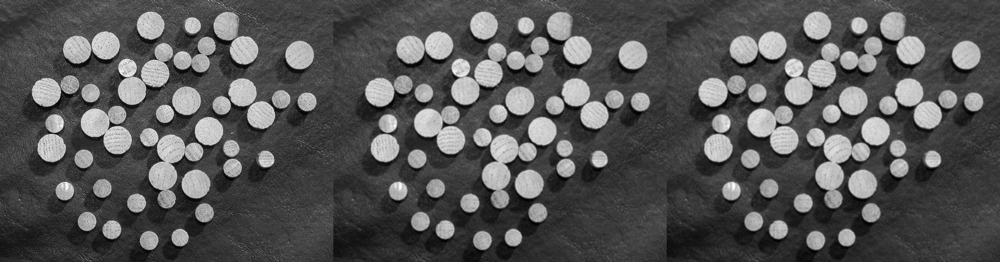

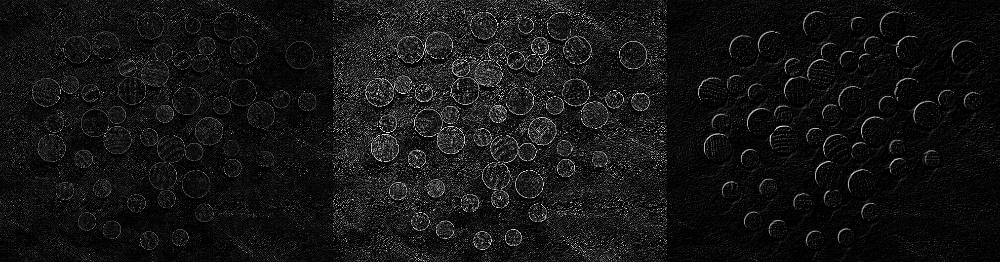

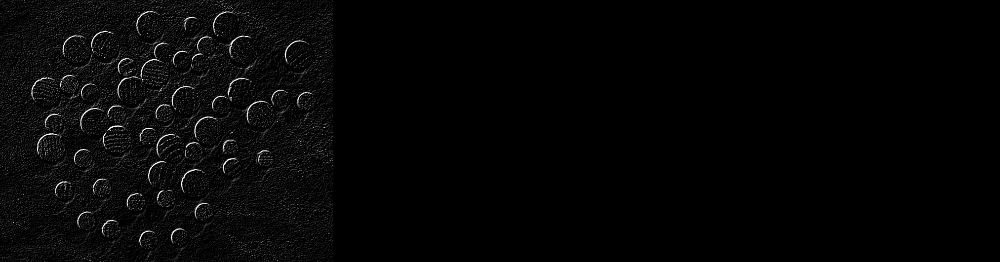

In [ ]:
img3=cv2.imread('Fig0941(a)(wood_dowels).tif')

def resize_half(img3):
    return cv2.resize(img3, (0,0), fx=0.5, fy=0.5)

# 3) 마스크 정의
mask_mean = np.array([
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9],
    [1/9, 1/9, 1/9]
], dtype=np.float32)

mask_gaussian = np.array([
    [0.0030, 0.0133, 0.0219, 0.0133, 0.0030],
    [0.0133, 0.0596, 0.0983, 0.0596, 0.0133],
    [0.0219, 0.0983, 0.1621, 0.0983, 0.0219],
    [0.0133, 0.0596, 0.0983, 0.0596, 0.0133],
    [0.0030, 0.0133, 0.0219, 0.0133, 0.0030]
], dtype=np.float32)

mask_lap4 = np.array([
    [0, -1, 0],
    [-1, 4, -1],
    [0, -1, 0]
], dtype=np.float32)

mask_lap8 = np.array([
    [-1, -1, -1],
    [-1,  8, -1],
    [-1, -1, -1]
], dtype=np.float32)

mask_diag1 = np.array([
    [-1, 0, 0],
    [ 0, 0, 0],
    [ 0, 0, 1]
], dtype=np.float32)

mask_diag2 = np.array([
    [-1, -1, 0],
    [-1,  0, 1],
    [ 0,  1, 1]
], dtype=np.float32)

# 4) 컨볼루션 함수
def apply_filter(image, kernel):
    filtered = cv2.filter2D(image, -1, kernel)
    return filtered

def show_edge(img3):
    abs_img = np.abs(img3)
    norm = cv2.normalize(abs_img, None, 0, 255, cv2.NORM_MINMAX)
    return np.uint8(norm)

# 5) 각 결과 생성
out_mean = show_edge(apply_filter(img3, mask_mean))
out_gaussian = show_edge(apply_filter(img3, mask_gaussian))
out_lap4 = show_edge(apply_filter(img3, mask_lap4))
out_lap8 = show_edge(apply_filter(img3, mask_lap8))
out_diag1 = show_edge(apply_filter(img3, mask_diag1))
out_diag2 = show_edge(apply_filter(img3, mask_diag2))

result1 = np.hstack((img3, out_mean, out_gaussian))
result2 = np.hstack((out_lap4, out_lap8, out_diag1))
result3 = np.hstack((out_diag2, np.zeros_like(out_diag2), np.zeros_like(out_diag2)))

cv2_imshow(result1)
cv2_imshow(result2)
cv2_imshow(result3)


# HW#2-3
**결과 분석**

1. mean filter
* 주변 픽셀의 평균값으로 변환하여 영상을 부드럽게 만든다.
* 잡음이 감소하지만 경계와 세부 정보가 흐려진다.
2. Gaussian filter
* 중심에 높은 가중치를 부여하여 부드럽게 평활화한다.
* 평균 필터보다 자연스러운 블러링 효과를 보인다.
3. Laplacian (4-이웃)
* 상하좌우 방향의 밝기 변화를 강조한다.
* 객체의 경계가 얇고 선명하게 나타난다.
4. Laplacian (8-이웃)
* 모든 방향의 밝기 변화를 강조한다.
* 4-이웃보다 더 강한 에지 검출이 이루어진다.
5. 방향성 마스크
* 특정 방향의 밝기 변화만 강조한다.
* 원형 객체의 특정 방향 경계가 선택적으로 나타난다.

**결론**

평균 및 가우시안 필터는 영상의 잡음을 줄이고 부드럽게 만드는 데 효과적이며,
Laplacian 및 방향성 마스크는 객체의 경계와 방향성을 강조하는 데 효과적이다.

In [ ]:
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/school.jpg"

--2026-04-11 06:44:01--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/school.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824868 (806K) [image/jpeg]
Saving to: ‘school.jpg’

school.jpg          100%[===================>] 805.54K  --.-KB/s    in 0.05s   

2026-04-11 06:44:01 (16.1 MB/s) - ‘school.jpg’ saved [824868/824868]



In [101]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

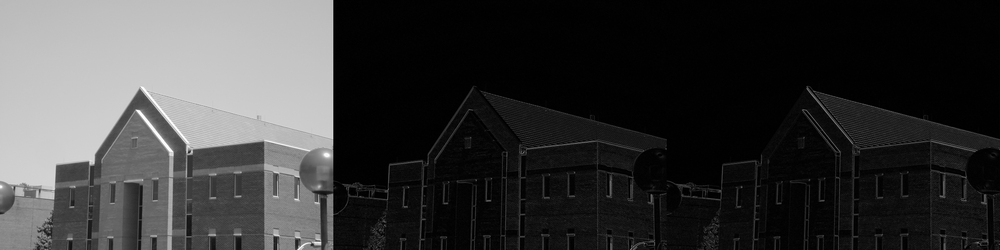

In [110]:

# grayscale 이미지
img4 = cv2.imread('school.jpg', cv2.IMREAD_GRAYSCALE)

# Sobel x, y
grad_x = cv2.Sobel(img4, cv2.CV_32F, 1, 0, ksize=3)
grad_y = cv2.Sobel(img4, cv2.CV_32F, 0, 1, ksize=3)

# 45°, -45° 방향 생성
edge_45 = grad_x + grad_y
edge_m45 = grad_x - grad_y

# 절댓값 + 정규화
edge_45 = cv2.normalize(np.abs(edge_45), None, 0, 255, cv2.NORM_MINMAX)
edge_m45 = cv2.normalize(np.abs(edge_m45), None, 0, 255, cv2.NORM_MINMAX)

edge_45 = np.uint8(edge_45)
edge_m45 = np.uint8(edge_m45)

# 크기 맞추기
def resize_half(img):
    return cv2.resize(img, (0,0), fx=0.5, fy=0.5)

img_r = resize_half(img4)
edge45_r = resize_half(edge_45)
edge_m45_r = resize_half(edge_m45)

# 수평 결합
result = np.hstack((img_r, edge45_r, edge_m45_r))

cv2_imshow(result)

# HW#2-4
**결과 분석**

1. Sobel x, y 결과
* Sobel 연산자를 이용하여 x 방향(수직 에지)과 y 방향(수평 에지)의 밝기 변화를 각각 계산하였다.
* 이를 통해 영상의 기본적인 에지 정보를 추출할 수 있다.
2. 45° 방향 에지 (Gx + Gy)
* x 방향과 y 방향의 결과를 더하여 대각선(↗) 방향의 밝기 변화를 강조하였다.
* 건물 지붕과 같은 45° 방향의 구조가 뚜렷하게 나타난다.
3. -45° 방향 에지 (Gx − Gy)
* x 방향과 y 방향의 결과를 빼서 반대 대각선(↘) 방향의 에지를 강조하였다.
* 45°와는 다른 방향의 경계가 선택적으로 검출된다.

**결론**

Sobel 연산자를 x, y 방향으로 적용한 후 선형 결합을 통해
45° 및 -45° 방향의 에지를 효과적으로 검출할 수 있다.

In [105]:
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/finger.jpg"

--2026-04-11 07:03:35--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/finger.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 73452 (72K) [image/jpeg]
Saving to: ‘finger.jpg.1’

finger.jpg.1        100%[===================>]  71.73K  --.-KB/s    in 0.01s   

2026-04-11 07:03:35 (5.70 MB/s) - ‘finger.jpg.1’ saved [73452/73452]



In [107]:
img5=cv2.imread('finger.jpg')

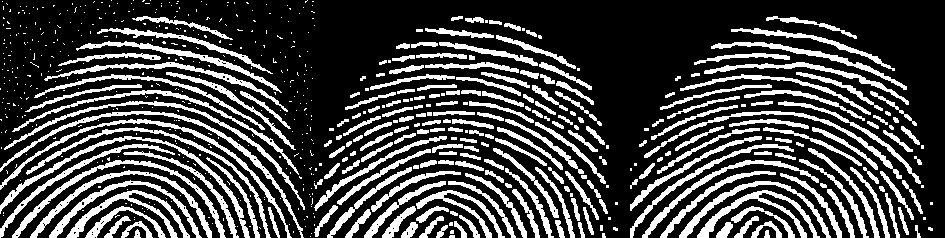

In [111]:
# 이진화 (threshold)
_, binary = cv2.threshold(img5, 127, 255, cv2.THRESH_BINARY)

# 구조 요소 (3x3)
kernel = np.ones((3,3), np.uint8)

# 1. Opening (노이즈 제거)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

# 2. Closing (끊긴 부분 연결)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

# 출력
result = np.hstack((img5, opening, closing))

cv2_imshow(result)

# HW#2-5
**결과 분석**

1. Opening 연산
* 침식 후 팽창을 통해 작은 노이즈를 제거하였다.
* 배경의 잡음이 감소하였다.
2. Closing 연산
* 팽창 후 침식을 통해 끊어진 지문 선을 연결하였다.
* 지문의 연속성이 개선되었다.

**결론**

모폴로지 연산을 통해 노이즈를 제거하고 객체의 형태를 보존하면서
영상의 품질을 개선할 수 있다.

In [121]:
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0905(a)(wirebond-mask).tif"

--2026-04-11 07:15:21--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0905(a)(wirebond-mask).tif
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30092 (29K) [image/tiff]
Saving to: ‘Fig0905(a)(wirebond-mask).tif.2’

Fig0905(a)(wirebond 100%[===================>]  29.39K  --.-KB/s    in 0.002s  

2026-04-11 07:15:21 (11.9 MB/s) - ‘Fig0905(a)(wirebond-mask).tif.2’ saved [30092/30092]



In [122]:
img6=cv2.imread('Fig0905(a)(wirebond-mask).tif')

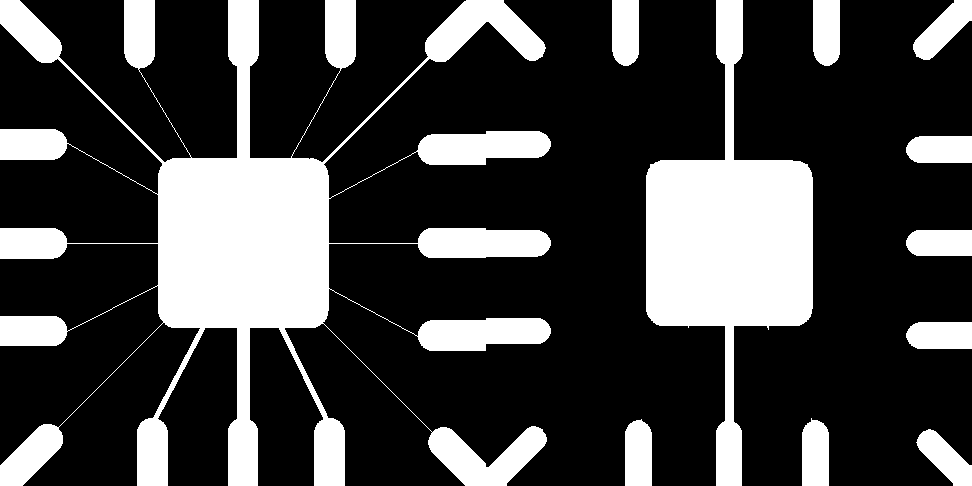

In [127]:
# 이진화
_, binary = cv2.threshold(img6, 127, 255, cv2.THRESH_BINARY)

# 구조 요소 (조금 크게 잡는게 포인트)
kernel = np.ones((5,5), np.uint8)

# erosion 적용
eroded = cv2.erode(binary, kernel, iterations=1)

# 출력
result = np.hstack((binary, eroded))

cv2_imshow(result)


# HW#2-6
**결과 분석**

* 침식(Erosion) 연산을 적용하여 영상 내의 얇은 선 구조를 제거하였다.
* 구조 요소보다 작은 객체는 제거되므로, 얇은 연결선이 사라지고 주요 구조만 남게 되었다.
* 두꺼운 객체는 구조 요소보다 크기 때문에 형태를 유지하였다.

**결론**

Erosion 연산을 통해 영상에서 얇은 객체를 효과적으로 제거할 수 있다.


In [128]:
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0939(a)(headCT-Vandy).tif"

--2026-04-11 07:19:49--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0939(a)(headCT-Vandy).tif
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 262750 (257K) [image/tiff]
Saving to: ‘Fig0939(a)(headCT-Vandy).tif’

Fig0939(a)(headCT-V 100%[===================>] 256.59K  --.-KB/s    in 0.04s   

2026-04-11 07:19:49 (6.99 MB/s) - ‘Fig0939(a)(headCT-Vandy).tif’ saved [262750/262750]



In [132]:
img7=cv2.imread('Fig0939(a)(headCT-Vandy).tif')

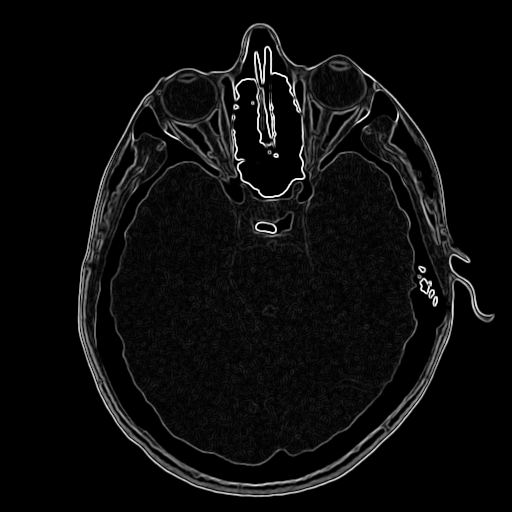

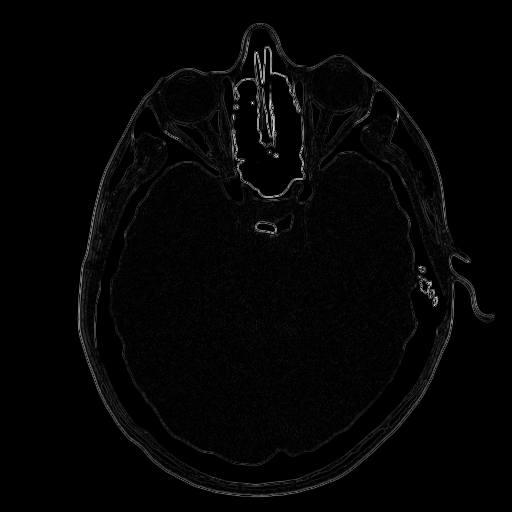

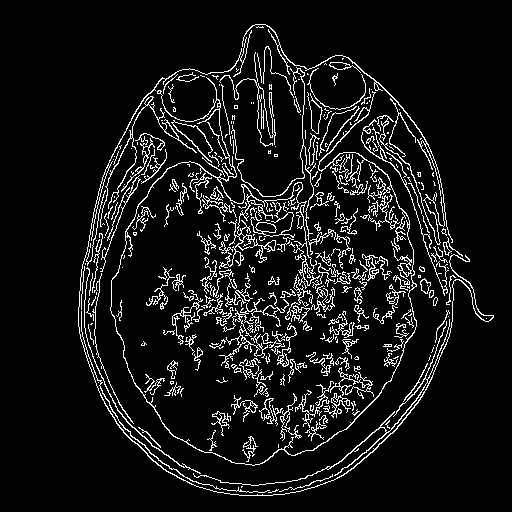

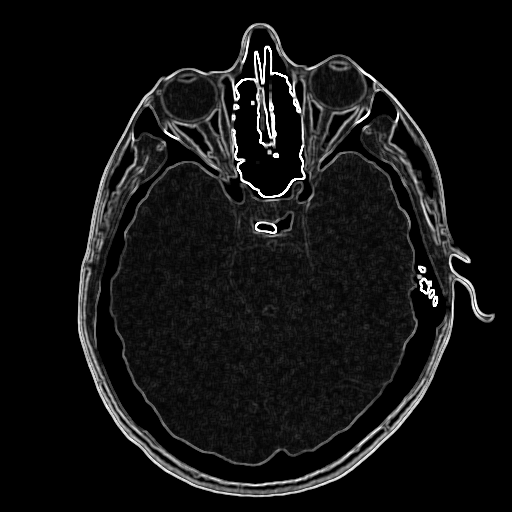

In [139]:
def resize_half(image):
    return cv2.resize(image, (0,0), fx=0.6, fy=0.6)

# 1. Sobel
sobel_x = cv2.Sobel(img7, cv2.CV_32F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(img7, cv2.CV_32F, 0, 1, ksize=3)
sobel = cv2.magnitude(sobel_x, sobel_y)
sobel = cv2.normalize(sobel, None, 0, 255, cv2.NORM_MINMAX)
sobel = np.uint8(sobel)

# 2. Laplacian
lap = cv2.Laplacian(img7, cv2.CV_32F, ksize=3)
lap = cv2.normalize(np.abs(lap), None, 0, 255, cv2.NORM_MINMAX)
lap = np.uint8(lap)

# 3. Canny
canny = cv2.Canny(img7, 50, 150)

# 4. Morphological Gradient
kernel = np.ones((3,3), np.uint8)
morph_grad = cv2.morphologyEx(img7, cv2.MORPH_GRADIENT, kernel)


# 출력
cv2_imshow(sobel)
cv2_imshow(lap)
cv2_imshow(canny)
cv2_imshow(morph_grad)

# HW#2-7
**결과 분석**

1. Sobel
* 1차 미분을 이용하여 에지를 검출하였다.
* 경계가 비교적 뚜렷하게 나타나지만, 에지가 다소 두껍게 표현되었다.
2. Laplacian
* 2차 미분을 이용하여 모든 방향의 에지를 강조하였다.
* 에지 검출은 강하게 이루어지지만, 잡음에도 민감하게 반응하였다.
3. Canny
* 가장 얇고 선명한 에지를 검출하였다.
* 불필요한 잡음이 상대적으로 적고, 경계가 명확하게 나타났다.
4. Morphological Gradient
* 팽창과 침식의 차이를 이용하여 객체의 외곽선을 검출하였다.
* 경계가 전체적으로 두껍게 나타나며, 형태 정보가 강조되었다.

**결론**

Sobel은 기본적인 경계 검출에 적합하고, Laplacian은 모든 방향의 에지를 강하게 검출하지만 잡음에 민감하다.
Canny는 가장 선명하고 얇은 에지를 제공하며, Morphological Gradient는 객체의 외곽 형태를 강조하는 데 효과적이다.

In [142]:
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0938(a)(cygnusloop_Xray_original).tif"

--2026-04-11 07:37:47--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0938(a)(cygnusloop_Xray_original).tif
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 321002 (313K) [image/tiff]
Saving to: ‘Fig0938(a)(cygnusloop_Xray_original).tif.1’

Fig0938(a)(cygnuslo 100%[===================>] 313.48K  --.-KB/s    in 0.03s   

2026-04-11 07:37:47 (9.71 MB/s) - ‘Fig0938(a)(cygnusloop_Xray_original).tif.1’ saved [321002/321002]



In [145]:
img8=cv2.imread('Fig0938(a)(cygnusloop_Xray_original).tif')

In [150]:
# 1. Smoothing Filter (Gaussian)
gaussian = cv2.GaussianBlur(img8, (5,5), 0)

In [175]:
# 2. Morphological Smoothing
_, binary = cv2.threshold(img8, 127, 255, cv2.THRESH_BINARY)
kernel = np.ones((3,3), np.uint8)

opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
closing2 = cv2.morphologyEx(closing, cv2.MORPH_CLOSE, kernel)

dilate = cv2.dilate(closing2, kernel, iterations=1)
morph = dilate



Original Image


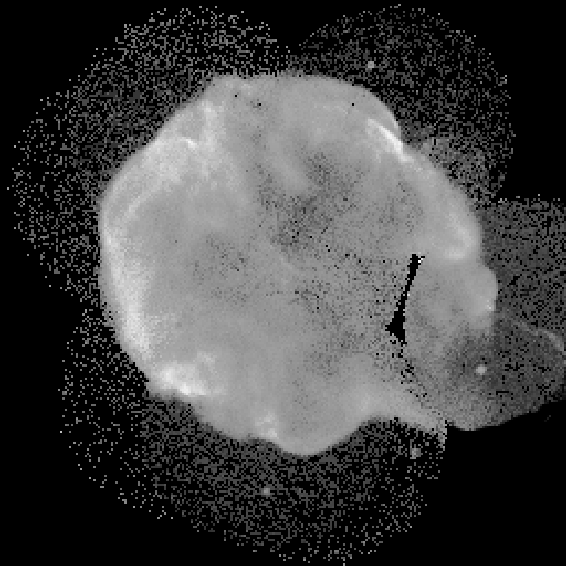

Gaussian Smoothing


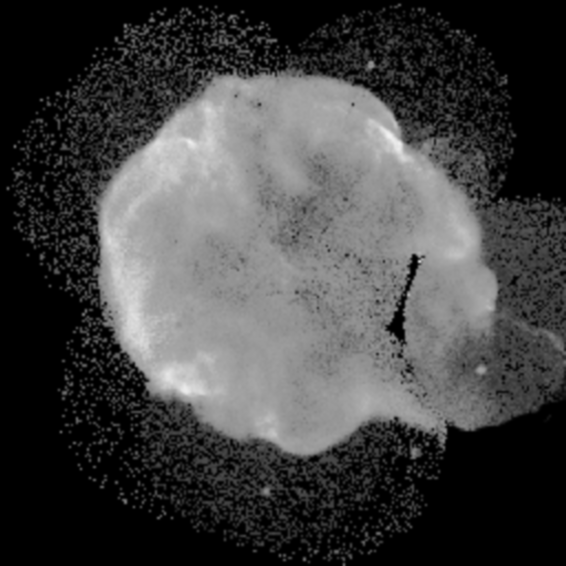

Morphological Smoothing


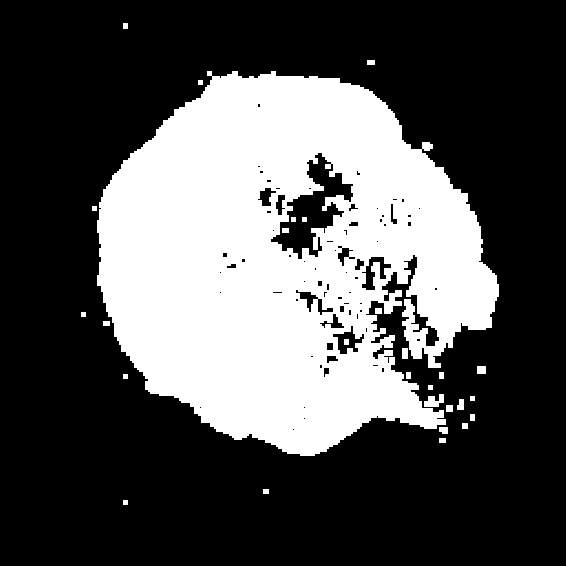

In [176]:
print("Original Image")
cv2_imshow(img8)

print("Gaussian Smoothing")
cv2_imshow(gaussian)

print("Morphological Smoothing")
cv2_imshow(morph)

# HW#2-8
**결과 분석**

1. Gaussian Smoothing
* Gaussian filter를 적용하여 영상의 노이즈를 감소시켰다.
* 전체적으로 영상이 부드러워졌으며, 잡음이 줄어드는 효과를 확인할 수 있었다.

2. Morphological Smoothing
* 영상을 이진화한 후 opening과 closing 연산을 적용하였다.
* 작은 점 형태의 노이즈가 효과적으로 제거되었으며, 객체의 형태는 비교적 잘 유지되었다.
* 일부 내부 노이즈는 남아있었으나, 형태 보존과 노이즈 제거 사이의 균형을 확인할 수 있었다.


**결론**

* Gaussian smoothing은 전체적인 노이즈 제거에 효과적이지만 경계가 흐려지고,
Morphological smoothing은 형태를 유지하면서 노이즈를 제거하는 데 효과적이다.
* 노이즈 제거와 형태 보존 사이에는 trade-off가 존재한다.

In [178]:
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0940(a)(rice_image_with_intensity_gradient).tif"

--2026-04-11 07:58:41--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0940(a)(rice_image_with_intensity_gradient).tif
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 360574 (352K) [image/tiff]
Saving to: ‘Fig0940(a)(rice_image_with_intensity_gradient).tif.1’

Fig0940(a)(rice_ima 100%[===================>] 352.12K  --.-KB/s    in 0.04s   

2026-04-11 07:58:41 (9.81 MB/s) - ‘Fig0940(a)(rice_image_with_intensity_gradient).tif.1’ saved [360574/360574]



In [180]:
# 1. 이미지 읽기
img9 = cv2.imread('Fig0940(a)(rice_image_with_intensity_gradient).tif', cv2.IMREAD_GRAYSCALE)

In [217]:
# 2. Otsu 이진화
t1, otsu_bin = cv2.threshold(
    img9, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
)
print("원영상 Otsu threshold =", t1)

원영상 Otsu threshold = 134.0


In [218]:
# 3) 큰 디스크(ellipse) 구조요소로 opening -> 배경 추출
se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (81, 81))

background = cv2.morphologyEx(img9, cv2.MORPH_OPEN, se)

In [220]:
# 4) 원영상 - 배경 = Top-hat 효과
tophat = cv2.subtract(img9, background)

In [223]:
# 5) Top-hat 결과에 Otsu 이진화
t2, tophat_bin = cv2.threshold(
    tophat, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
)
print("Top-hat 영상 Otsu threshold =", t2)

Top-hat 영상 Otsu threshold = 57.0


Original


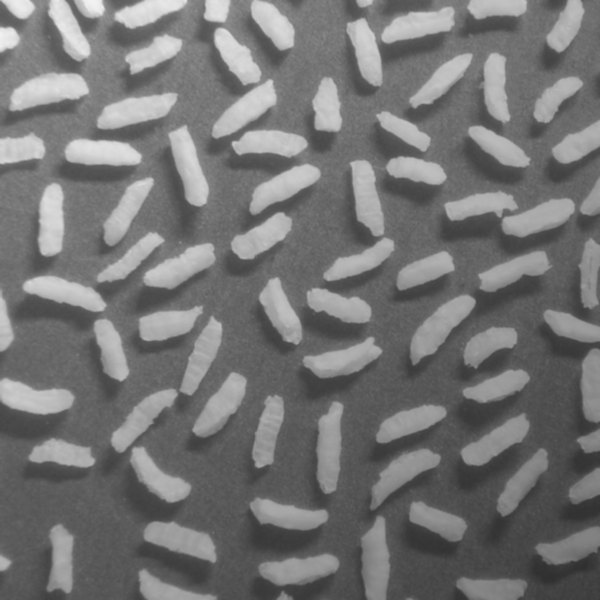

Otsu on original


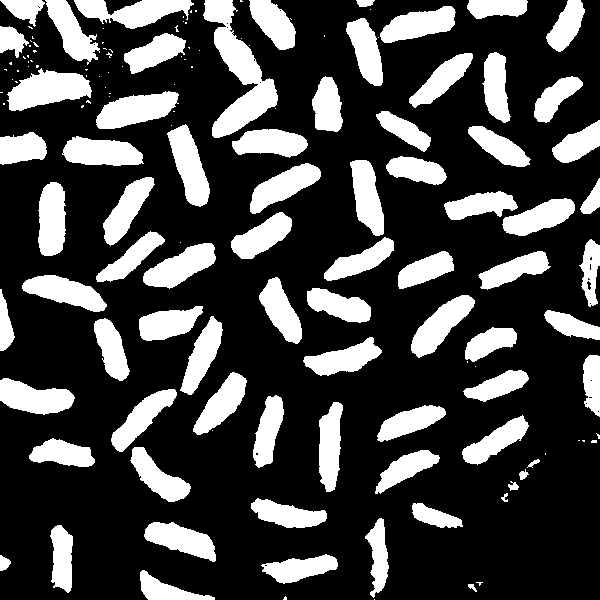

Estimated background by opening


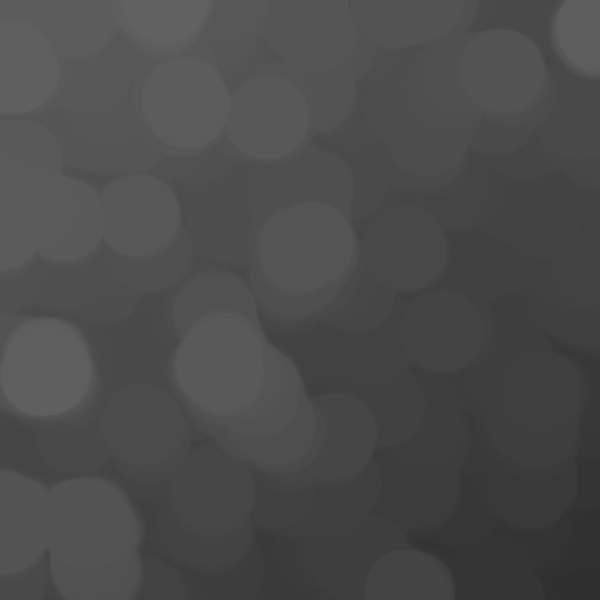

Top-hat (img - background)


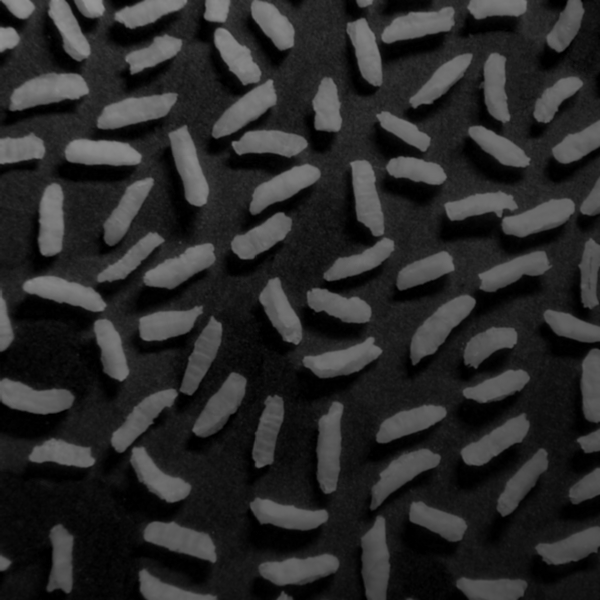

Otsu on Top-hat


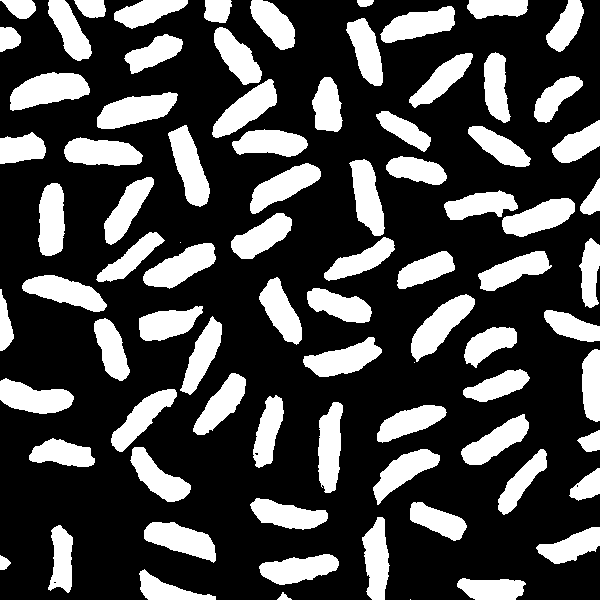

In [224]:
# 6) 출력
print("Original")
cv2_imshow(img9)

print("Otsu on original")
cv2_imshow(otsu_bin)

print("Estimated background by opening")
cv2_imshow(background)

print("Top-hat (img - background)")
cv2_imshow(tophat)

print("Otsu on Top-hat")
cv2_imshow(tophat_bin)

# HW#2-9
**결과 분석**

* 원영상에 Otsu 이진화를 직접 적용한 경우, 객체와 배경은 비교적 분리되었으나 배경 밝기 변화의 영향을 받았다.
* 큰 디스크형 구조요소를 이용한 opening 연산으로 배경 영상을 추출한 뒤, 이를 원영상에서 빼서 Top-hat 영상을 얻었다.
* Top-hat 변환 후 Otsu 이진화를 적용한 결과, 배경의 불균일한 밝기 성분이 줄어들어 쌀 객체가 더욱 뚜렷하게 분리되었다.
* 따라서 배경 밝기가 균일하지 않은 영상에서는 Top-hat 변환을 선행한 후 이진화를 수행하는 것이 더 효과적임을 확인할 수 있었다.






In [242]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [226]:
!wget "https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0943(a)(dark_blobs_on_light_background).tif"

--2026-04-11 08:16:55--  https://raw.githubusercontent.com/kjcheoi-class/CV/main/Fig0943(a)(dark_blobs_on_light_background).tif
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 360678 (352K) [image/tiff]
Saving to: ‘Fig0943(a)(dark_blobs_on_light_background).tif.1’

Fig0943(a)(dark_blo 100%[===================>] 352.22K  --.-KB/s    in 0.03s   

2026-04-11 08:16:56 (10.3 MB/s) - ‘Fig0943(a)(dark_blobs_on_light_background).tif.1’ saved [360678/360678]



In [238]:
img10 = cv2.imread('Fig0943(a)(dark_blobs_on_light_background).tif', cv2.IMREAD_GRAYSCALE)

In [294]:
# 2. 이진화 (어두운 blob → 흰색)
_, binary = cv2.threshold(img10, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
print(f"이진화 후 흰색 픽셀 비율: {(binary==255).mean()*100:.1f}%")

이진화 후 흰색 픽셀 비율: 41.0%


In [303]:
# 3. (b) Closing → 작은 blob 제거
SE_CLOSE = 65

se_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (SE_CLOSE, SE_CLOSE))

# 여기서는 작은 blob을 없애야 하므로 OPEN을 먼저 써서 작은 blob 제거
img_b_bin = cv2.morphologyEx(binary, cv2.MORPH_OPEN, se_close)

# 시각화용: 이진 결과를 그레이스케일로 표시
img_b_vis = np.where(img_b_bin == 255, 50, 220).astype(np.uint8)

In [360]:
# 4. (c) Opening → 큰 blob 밀집 영역 마스크 생성
SE_CLOSE2 = 150
se_close2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (SE_CLOSE2, SE_CLOSE2))
img_c_bin = cv2.morphologyEx(img_b_bin, cv2.MORPH_CLOSE, se_close2)

# 이진 → 그레이스케일 시각화
img_c_vis = np.where(img_c_bin == 255, 50, 220).astype(np.uint8)

In [361]:
# 5. (d) Morphological Gradient → 경계 추출 ─
se_grad = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
gradient = cv2.morphologyEx(img_c_bin, cv2.MORPH_GRADIENT, se_grad)
img_d = img10.copy()
img_d[gradient == 255] = 255


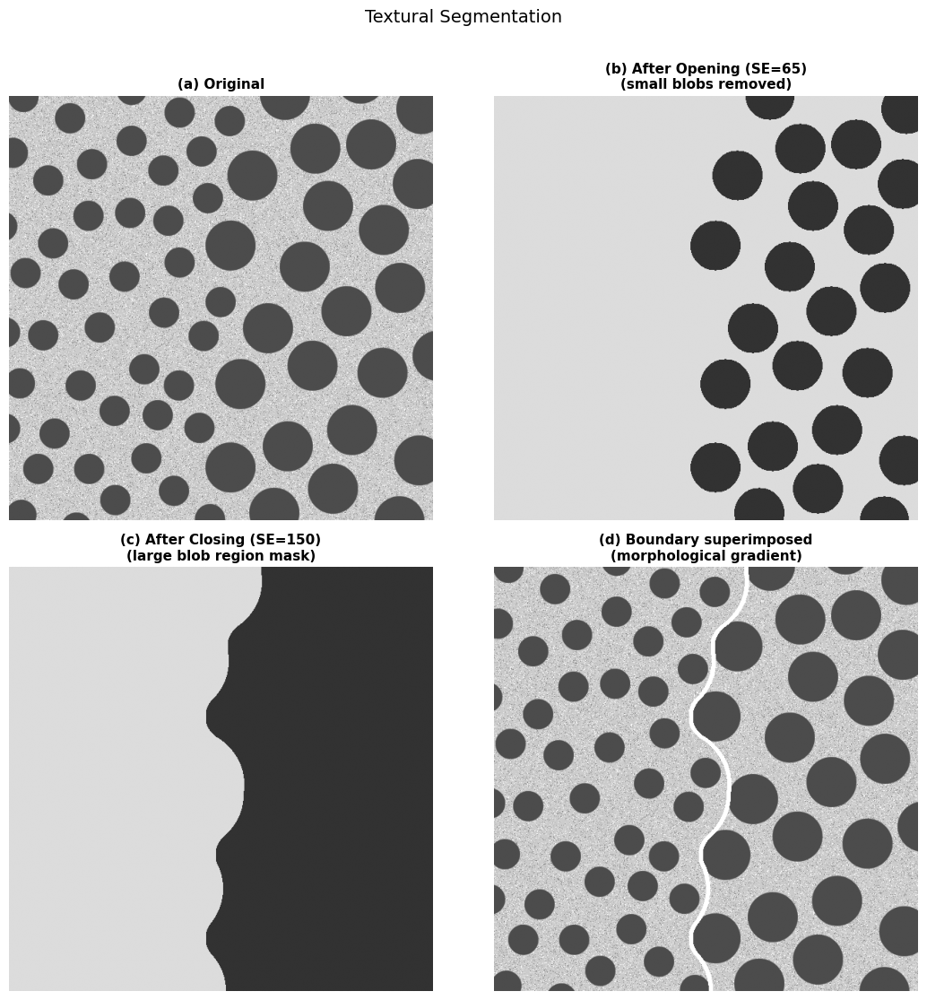

In [363]:
fig, axes = plt.subplots(2, 2, figsize=(11, 11))
fig.patch.set_facecolor('white')

plots = [
    (img10,     '(a) Original'),
    (img_b_vis, f'(b) After Opening (SE={SE_CLOSE})\n(small blobs removed)'),
    (img_c_vis, f'(c) After Closing (SE={SE_CLOSE2})\n(large blob region mask)'),
    (img_d,     '(d) Boundary superimposed\n(morphological gradient)'),
]

for ax, (img, title) in zip(axes.flat, plots):
    ax.imshow(img, cmap='gray', vmin=0, vmax=255)
    ax.set_title(title, fontsize=11, fontweight='bold')
    ax.axis('off')

plt.suptitle('Textural Segmentation', fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig('result_fig9_43_fixed.png', dpi=150, bbox_inches='tight')
plt.show()

# HW#2-10
**결과 분석**

* 원영상은 큰 원형 blob과 작은 원형 blob이 혼재된 600×600 grayscale 영상으로, 두 종류의 텍스처 영역이 공간적으로 분리되어 있다.

* Otsu 이진화 후 Opening 연산(SE=타원 40px)을 적용하여 작은 blob을 제거하고 큰 blob만 남긴 영상 (b)를 얻었다.

* (b)에 큰 구조요소(SE=타원 80px)로 Closing 연산을 수행하여 큰 blob들 사이의 빈 공간을 채움으로써 밀집 영역 전체를 하나의 덩어리로 표현한 영역 마스크 (c)를 생성하였다.

* (c)의 마스크에 Morphological Gradient(팽창 − 침식)를 적용하여 두 텍스처 영역 간의 경계선을 추출하고, 이를 원영상에 흰색으로 오버레이하여 최종 분할 결과 (d)를 얻었다.

* 따라서 크기가 다른 구조요소를 단계적으로 적용하는 morphological 연산의 조합이 픽셀 단위 특징 없이도 텍스처 기반 영역 분할에 효과적임을 확인할 수 있었다.



